# Analysis of 311 NYC service request
Background of Problem Statement :
NYC 311's mission is to provide the public with quick and easy access to all New York City government services and information while offering the best customer service. Each day, NYC311 receives thousands of requests related to several hundred types of non-emergency services, including noise complaints, plumbing issues, and illegally parked cars. These requests are received by NYC311 and forwarded to the relevant agencies such as the police, buildings, or transportation. The agency responds to the request, addresses it, and then closes it.

Problem Objective :
Perform a service request data analysis of New York City 311 calls. You will focus on the data wrangling techniques to understand the pattern in the data and also visualize the major complaint types.

Domain:
Customer Service
Analysis Tasks to be performed:
(Perform a service request data analysis of New York City 311 calls)

Import a 311 NYC service request.

Read or convert the columns ‘Created Date’ and Closed Date’ to datetime datatype and create a new column ‘Request_Closing_Time’ as the time elapsed between request creation and request closing.

Provide major insights/patterns that you can offer in a visual format (graphs or tables); at least 4 major conclusions that you can come up with after generic data mining.

Order the complaint types based on the average ‘Request_Closing_Time’, grouping them for different locations.

Perform a statistical test for the following:

Please note: For the below statements you need to state the Null and Alternate and then provide a statistical test to accept or reject the Null Hypothesis along with the corresponding ‘p-value’.

Whether the average response time across complaint types is similar or not (overall)
Are the type of complaint or service requested and location related?

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#DATA=pd.read_csv(r"C:\Users\DEEKSHA\Desktop\PYTHON\Simpli learn assesment\Data Science with Python Two\311_Service_Requests_from_2010_to_Present - Copy.csv",low_memory=False)
DATA=pd.read_csv("311_Service_Requests_from_2010_to_Present.csv",low_memory=False)

In [3]:
DATA.columns.unique()

Index(['Unique Key', 'Created Date', 'Closed Date', 'Agency', 'Agency Name',
       'Complaint Type', 'Descriptor', 'Location Type', 'Incident Zip',
       'Incident Address', 'Street Name', 'Cross Street 1', 'Cross Street 2',
       'Intersection Street 1', 'Intersection Street 2', 'Address Type',
       'City', 'Landmark', 'Facility Type', 'Status', 'Due Date',
       'Resolution Description', 'Resolution Action Updated Date',
       'Community Board', 'Borough', 'X Coordinate (State Plane)',
       'Y Coordinate (State Plane)', 'Park Facility Name', 'Park Borough',
       'School Name', 'School Number', 'School Region', 'School Code',
       'School Phone Number', 'School Address', 'School City', 'School State',
       'School Zip', 'School Not Found', 'School or Citywide Complaint',
       'Vehicle Type', 'Taxi Company Borough', 'Taxi Pick Up Location',
       'Bridge Highway Name', 'Bridge Highway Direction', 'Road Ramp',
       'Bridge Highway Segment', 'Garage Lot Name', 'Ferry 

In [4]:
DATA.describe()

,Unique Key,Incident Zip,X Coordinate (State Plane),Y Coordinate (State Plane),School or Citywide Complaint,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Garage Lot Name,Latitude,Longitude
count,3.006980e+05,298083.000000,2.971580e+05,297158.000000,0.0,0.0,0.0,0.0,0.0,297158.000000,297158.000000
mean,3.130054e+07,10848.888645,1.004854e+06,203754.534416,NaN,NaN,NaN,NaN,NaN,40.725885,-73.925630
std,5.738547e+05,583.182081,2.175338e+04,29880.183529,NaN,NaN,NaN,NaN,NaN,0.082012,0.078454
min,3.027948e+07,83.000000,9.133570e+05,121219.000000,NaN,NaN,NaN,NaN,NaN,40.499135,-74.254937
25%,3.080118e+07,10310.000000,9.919752e+05,183343.000000,NaN,NaN,NaN,NaN,NaN,40.669796,-73.972142
50%,3.130436e+07,11208.000000,1.003158e+06,201110.500000,NaN,NaN,NaN,NaN,NaN,40.718661,-73.931781
75%,3.178446e+07,11238.000000,1.018372e+06,224125.250000,NaN,NaN,NaN,NaN,NaN,40.781840,-73.876805
max,3.231065e+07,11697.000000,1.067173e+06,271876.000000,NaN,NaN,NaN,NaN,NaN,40.912869,-73.700760


# Creating Request closing time column

In [5]:
DATA['Created Date']=pd.to_datetime(DATA['Created Date'])
DATA['Closed Date']=pd.to_datetime(DATA['Closed Date'])
DATA['Request_Closing_Time']=DATA['Closed Date']-DATA['Created Date']

In [6]:
print(DATA['Request_Closing_Time'][186023])
print(DATA['Created Date'][186023])
print(DATA['Closed Date'][186023])

0 days 07:32:00
2015-07-12 17:01:00
2015-07-13 00:33:00


# Details of amount of Complaints Raised using bar graph

In [7]:
complain_type=DATA.groupby('Complaint Type').size()
complain_type.drop(["Animal Abuse","Ferry Complaint"])
complain_type

Complaint Type
Agency Issues                    6
Animal Abuse                  7778
Animal in a Park                 1
Bike/Roller/Skate Chronic      427
Blocked Driveway             77044
Derelict Vehicle             17718
Disorderly Youth               286
Drinking                      1280
Ferry Complaint                  2
Graffiti                       113
Homeless Encampment           4416
Illegal Fireworks              168
Illegal Parking              75361
Noise - Commercial           35577
Noise - House of Worship       931
Noise - Park                  4042
Noise - Street/Sidewalk      48612
Noise - Vehicle              17083
Panhandling                    307
Posting Advertisement          650
Squeegee                         4
Traffic                       4498
Urinating in Public            592
Vending                       3802
dtype: int64

In [8]:
majorcomplints=DATA.dropna(subset=["Complaint Type"])
majorcomplints=DATA.groupby("Complaint Type")

sortedComplaintType = majorcomplints.size().sort_values(ascending = False)
sortedComplaintType = sortedComplaintType.to_frame('count').reset_index()

sortedComplaintType
sortedComplaintType.head(10)

,Complaint Type,count
0,Blocked Driveway,77044
1,Illegal Parking,75361
2,Noise - Street/Sidewalk,48612
3,Noise - Commercial,35577
4,Derelict Vehicle,17718
5,Noise - Vehicle,17083
6,Animal Abuse,7778
7,Traffic,4498
8,Homeless Encampment,4416
9,Noise - Park,4042


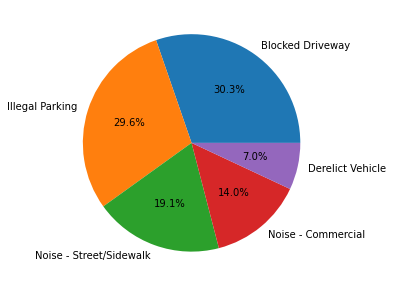

In [9]:
sortedComplaintType = sortedComplaintType.head()
plt.figure(figsize=(5,5))
plt.pie(sortedComplaintType['count'],labels=sortedComplaintType["Complaint Type"], autopct="%1.1f%%")
plt.show()

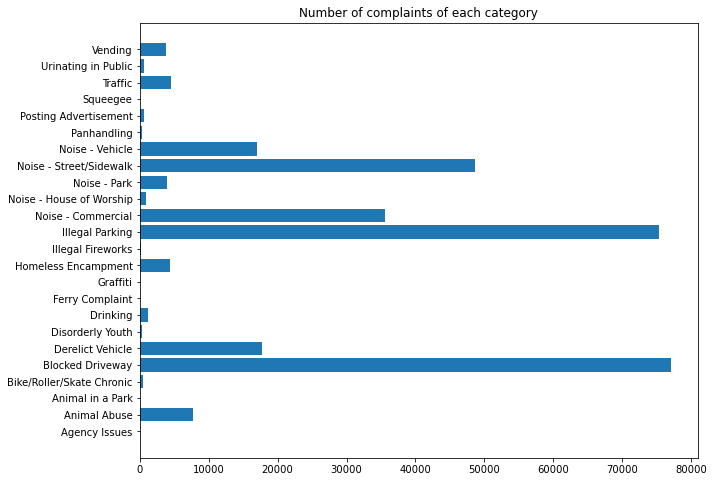

In [10]:
plt.figure(figsize=(10,8))
plt.barh(complain_type.index,complain_type)
plt.title("Number of complaints of each category")
plt.show()

In [11]:
Complaints=DATA['Complaint Type']
Avg_time=DATA['Request_Closing_Time']
Avg_df=pd.DataFrame(Avg_time)
GRAPH_2=pd.DataFrame(Complaints)
#GRAPH_2=GRAPH_2.join(Avg_time)
#GRAPH_2=GRAPH_2.groupby('Complaint Type')
seconds_df=Avg_df.astype('timedelta64[m]')

GRAPH_2=GRAPH_2.join(seconds_df)
GRAPH_2=GRAPH_2.groupby('Complaint Type').mean()
GRAPH_2=GRAPH_2.drop(["Animal in a Park","Ferry Complaint"])
GRAPH_2
GRAPH_2.sort_values(['Request_Closing_Time'],axis=0,ascending=True)

,Request_Closing_Time
Complaint Type,
Posting Advertisement,118.251543
Illegal Fireworks,165.470238
Noise - Commercial,188.524272
Noise - House of Worship,191.287406
Noise - Park,204.343859
Noise - Street/Sidewalk,206.415509
Traffic,206.614991
Disorderly Youth,213.167832
Noise - Vehicle,215.038220


In [12]:
GRAPH_2.index

Index(['Agency Issues', 'Animal Abuse', 'Bike/Roller/Skate Chronic',
       'Blocked Driveway', 'Derelict Vehicle', 'Disorderly Youth', 'Drinking',
       'Graffiti', 'Homeless Encampment', 'Illegal Fireworks',
       'Illegal Parking', 'Noise - Commercial', 'Noise - House of Worship',
       'Noise - Park', 'Noise - Street/Sidewalk', 'Noise - Vehicle',
       'Panhandling', 'Posting Advertisement', 'Squeegee', 'Traffic',
       'Urinating in Public', 'Vending'],
      dtype='object', name='Complaint Type')

# Average time taken to resolve issue of each type

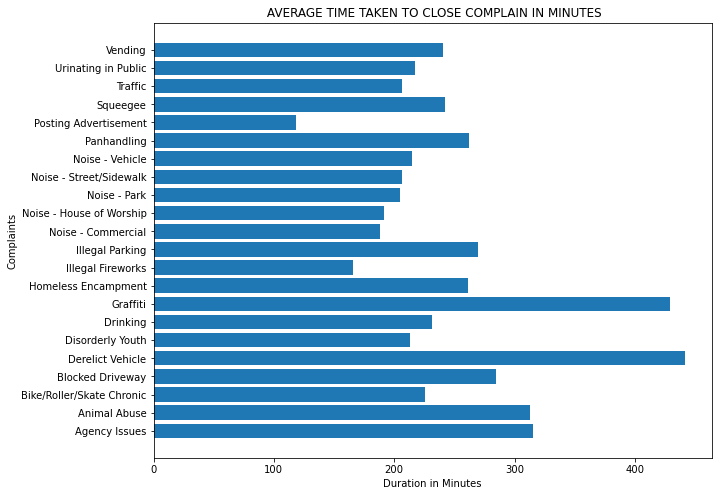

In [13]:

plt.figure(figsize=(10,8))
#plt.barh(complain_type.index,GRAPH_2['Request_Closing_Time'])
plt.barh(GRAPH_2.index,GRAPH_2['Request_Closing_Time'])
plt.title(" AVERAGE TIME TAKEN TO CLOSE COMPLAIN IN MINUTES")
plt.xlabel("Duration in Minutes")
plt.ylabel("Complaints")
plt.show()

In [14]:
GRAPH_3=DATA.groupby(['Complaint Type','Status'])
GRAPH_3=GRAPH_3['Complaint Type'].count().reset_index(name="count")


# Creating a data frame Contain Days and Months of Complaint date -----------------------------

In [15]:
# Creating a data frame Contain Days and Months of Complaint date -----------------------------
import calendar
Year_Month_Day = pd.to_datetime(DATA['Created Date'].dt.date)
Month_Day = pd.DataFrame()
Month_Day['Date'] = pd.to_datetime(Year_Month_Day.dt.date)
Month_Day['Month'] = Year_Month_Day.dt.month
Month_Day['Day'] = Year_Month_Day.dt.day
Month_Day['Month Name'] = Month_Day['Month'].apply(lambda x: calendar.month_abbr[x])
Month_Day['Day No'] = Month_Day['Date'].dt.weekday
Month_Day['Day Name'] = Month_Day['Day No'].map({0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',
                                                 5:'Saturday',6:'Sunday'})
Month_Day.sample(20)

,Date,Month,Day,Month Name,Day No,Day Name
147710,2015-08-15,8,15,Aug,5,Saturday
294388,2015-04-05,4,5,Apr,6,Sunday
298315,2015-03-31,3,31,Mar,1,Tuesday
1194,2015-12-30,12,30,Dec,2,Wednesday
226355,2015-06-08,6,8,Jun,0,Monday
291335,2015-04-09,4,9,Apr,3,Thursday
189595,2015-07-09,7,9,Jul,3,Thursday
29646,2015-12-02,12,2,Dec,2,Wednesday
84832,2015-10-10,10,10,Oct,5,Saturday
193418,2015-07-05,7,5,Jul,6,Sunday


In [16]:
Month_plot = Month_Day['Month Name'].value_counts()
Month_plot = Month_plot.to_frame()
Month_plot = Month_plot.rename(columns={'Month Name':'Counts'})
Month_plot

,Counts
May,36437
Sep,35427
Jun,35315
Aug,34956
Jul,34888
Oct,32605
Nov,30773
Dec,30521
Apr,27305
Mar,2471


In [17]:
Day_plot = Month_Day['Day Name'].value_counts()
Day_plot = Day_plot.to_frame()
Day_plot = Day_plot.rename(columns={'Day Name':'Counts'})
Day_plot

,Counts
Sunday,47969
Saturday,47564
Friday,43995
Thursday,41342
Monday,40489
Wednesday,39788
Tuesday,39551


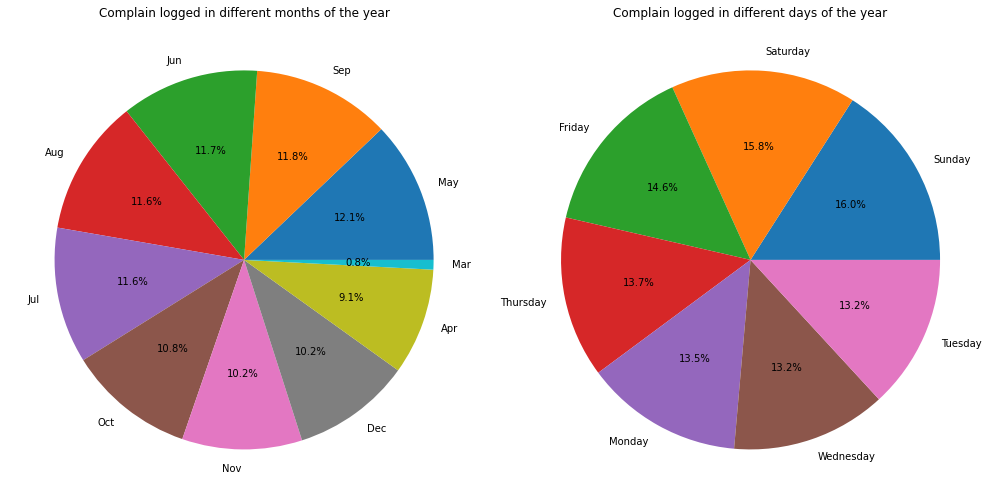

In [18]:
fig, axes = plt.subplots(1,2, figsize=(14,8))

axes[0].pie(Month_plot['Counts'], labels = Month_plot.index,autopct='%1.1f%%')
axes[0].set_title('Complain logged in different months of the year')

axes[1].pie(Day_plot['Counts'], labels = Day_plot.index,autopct='%1.1f%%')
axes[1].set_title('Complain logged in different days of the year')

plt.tight_layout()

In [19]:
Month_Day_grouped = Month_Day.groupby(['Month Name','Day Name'],as_index=False)['Day No'].count()
Month_Day_grouped_final = Month_Day_grouped.rename(columns={'Day No':'Counts'})
Month_Day_grouped_final.head(15)

,Month Name,Day Name,Counts
0,Apr,Friday,3565
1,Apr,Monday,3222
2,Apr,Saturday,4227
3,Apr,Sunday,4069
4,Apr,Thursday,4323
5,Apr,Tuesday,3586
6,Apr,Wednesday,4313
7,Aug,Friday,4684
8,Aug,Monday,5042
9,Aug,Saturday,6913


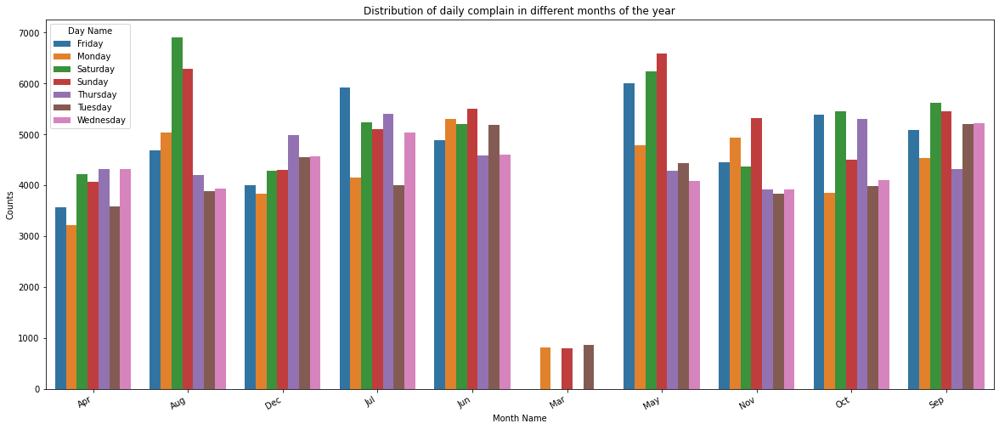

<Figure size 432x288 with 0 Axes>

In [20]:
import seaborn as sns
plt.figure(figsize=(20,8))

month_day_plot = sns.barplot(x=Month_Day_grouped_final['Month Name'], y=Month_Day_grouped_final['Counts'], 
                             hue=Month_Day_grouped_final['Day Name'], data=Month_Day_grouped_final)
month_day_plot.set_xticklabels(month_day_plot.get_xticklabels(), rotation=30, ha="right")
plt.title('Distribution of daily complain in different months of the year')
plt.show()
plt.tight_layout()

In [21]:
import folium
from folium.plugins import HeatMap

mymap=folium.Map(location=[DATA.Latitude.mean(), DATA.Longitude.mean()], zoom_start=12, control_scale=True)


In [22]:
plotmap=folium.Map(location=[DATA.Latitude.mean(), DATA.Longitude.mean()], zoom_start=12, control_scale=True)
DATA_TEST=DATA.dropna(subset = ["Longitude"])
Plot_Data=DATA_TEST.sample(n=500)

for index, location_info in Plot_Data.iterrows():
     folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["Complaint Type"]).add_to(plotmap)
    
plotmap

# Above map shows the Distribution of random 500 complaints raised through out the city along with the Complain Type

In [23]:
DATA_TEST=DATA.dropna(subset = ["Longitude"])
DATA_TEST
DATA_TEST.isna().sum()

heat_map=HeatMap(list(zip(DATA_TEST['Latitude'],DATA_TEST['Longitude'])),min_opacity=0.2,radius=50,blur=50,max_zoom=1).add_to(mymap)
     
mymap

# Heat map showing the over all distribution of complaints through out the city


In [24]:

data_place_CType_RCTime = DATA[['City','Complaint Type','Request_Closing_Time']]
data_place_CType_RCTime.dropna(subset = ['City','Complaint Type','Request_Closing_Time'], inplace = True)
data_place_CType_RCTime['DeltaT(in_hr.)'] = np.around( (data_place_CType_RCTime['Request_Closing_Time'].astype(np.int64)/
                                                      (pow(10,9)*3600) ), decimals=2)
#neg_time = data_place_CType_RCTime[data_place_CType_RCTime['DeltaT(in_hr.)'] < 0].sum()
#print('The no negative time difference (Created Time > Clossing Time, which is not possible) = \n',neg_time)
#data_place_CType_RCTime['DeltaT(in sec)/Avg.'] = np.around((data_place_CType_RCTime['DeltaT(in sec)']/Avarage_time),decimals=1)
data_place_CType_RCTime

<ipython-input-24-c4db07c19c3d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_place_CType_RCTime.dropna(subset = ['City','Complaint Type','Request_Closing_Time'], inplace = True)
<ipython-input-24-c4db07c19c3d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_place_CType_RCTime['DeltaT(in_hr.)'] = np.around( (data_place_CType_RCTime['Request_Closing_Time'].astype(np.int64)/


,City,Complaint Type,Request_Closing_Time,DeltaT(in_hr.)
0,NEW YORK,Noise - Street/Sidewalk,0 days 00:55:15,0.92
1,ASTORIA,Blocked Driveway,0 days 01:26:16,1.44
2,BRONX,Blocked Driveway,0 days 04:51:31,4.86
3,BRONX,Illegal Parking,0 days 07:45:14,7.75
4,ELMHURST,Illegal Parking,0 days 03:27:02,3.45
...,...,...,...,...
300692,NEW YORK,Noise - Commercial,0 days 00:38:29,0.64
300694,RICHMOND HILL,Blocked Driveway,0 days 02:00:31,2.01
300695,BROOKLYN,Noise - Commercial,0 days 03:07:17,3.12
300696,BRONX,Noise - Commercial,0 days 04:05:33,4.09


In [25]:
import scipy.stats as stat

In [26]:
Complaint_AvgTime = data_place_CType_RCTime.groupby(['Complaint Type']).agg({'DeltaT(in_hr.)':'mean'})
Complaint_AvgTime = pd.DataFrame(Complaint_AvgTime)
Complaint_AvgTime = Complaint_AvgTime.sort_values(['DeltaT(in_hr.)']).reset_index()
Complaint_AvgTime

,Complaint Type,DeltaT(in_hr.)
0,Posting Advertisement,1.975926
1,Illegal Fireworks,2.761190
2,Noise - Commercial,3.136907
3,Noise - House of Worship,3.193240
4,Noise - Park,3.401706
5,Noise - Street/Sidewalk,3.438573
6,Traffic,3.446291
7,Disorderly Youth,3.558916
8,Noise - Vehicle,3.588570
9,Urinating in Public,3.626486


# Ordering the complaint types based on the average ‘Request_Closing_Time’ (converted into integer and kept in column 'DeltaT(in_hr.)') and grouping them for different locations (such as 'City').


In [27]:
Complaint_City_AvgTime_grouped = data_place_CType_RCTime.groupby(['City','Complaint Type']).agg({'DeltaT(in_hr.)':'mean'})
Complaint_City_AvgTime_grouped = Complaint_City_AvgTime_grouped.rename(columns={'DeltaT(in_hr.)':'Avg. Time(Given City, Complaint Type)'})

Complaint_City_AvgTime_grouped = Complaint_City_AvgTime_grouped.sort_values(['City','Avg. Time(Given City, Complaint Type)'])
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


Complaint_City_AvgTime_grouped

Avg. Time(Given City, Complaint Type)
City                Complaint Type                                                  
ARVERNE             Drinking                                                0.240000
                    Vending                                                 0.480000
                    Urinating in Public                                     0.690000
                    Panhandling                                             1.030000
                    Noise - Park                                            1.285000
                    Graffiti                                                1.530000
                    Noise - House of Worship                                1.562727
                    Homeless Encampment                                     1.812500
                    Noise - Vehicle                                         1.860000
                    Noise - Street/Sidewalk                                 1.992759
                    Animal Abuse                                            2.153158
                    Noise - Commercial                                      2.285000
                    Illegal Parking                                         2.316207
                    Blocked Driveway                                        2.526286
                    Derelict Vehicle                                        2.968519
                    Disorderly Youth                                        3.595000
ASTORIA             Panhandling                                             1.150000
                    Bike/Roller/Skate Chronic                               1.740667
                    Noise - House of Worship                                2.022632
                    Illegal Fireworks                                       2.772500
                    Disorderly Youth                                        2.903333
                    Noise - Park                                            2.994754
                    Noise - Commercial                                      3.133039
                    Noise - Street/Sidewalk                                 3.450881
                    Noise - Vehicle                                         3.509020
                    Urinating in Public                                     4.626667
                    Drinking                                                4.722571
                    Blocked Driveway                                        4.816108
                    Illegal Parking                                         4.833371
                    Homeless Encampment                                     4.918750
                    Vending                                                 4.935556
                    Animal Abuse                                            5.000640
                    Traffic                                                 5.410851
                    Posting Advertisement                                   5.870000
                    Derelict Vehicle                                        9.689145
                    Graffiti                                               14.097500
Astoria             Noise - Commercial                                      3.542069
                    Noise - Street/Sidewalk                                 3.713333
                    Illegal Parking                                         4.711362
                    Blocked Driveway                                        4.915172
                    Derelict Vehicle                                        6.234167
BAYSIDE             Traffic                                                 1.526667
                    Noise - Street/Sidewalk                                 1.530667
                    Noise - Vehicle                                         1.709375
                    Vending                                                 1.880000
                    Drinking                        

# 1. T-test

(a) 1-sample T-test
It is noteworthy that the value of the Avg. time due to complaint type 'Animal in a Park' quite out of the range. Let's find out the average with or without this particular complaint type.


In [28]:
Tmean_without = float(Complaint_AvgTime[Complaint_AvgTime['Complaint Type']!='Animal in a Park'].mean())
print("Without complaint type 'Animal in a Park' ----- ",Tmean_without)
Tmean_with = float(Complaint_AvgTime['DeltaT(in_hr.)'].mean())
print("With complaint type 'Animal in a Park' ----- ",Tmean_with)

Without complaint type 'Animal in a Park' -----  4.0702191579496825
With complaint type 'Animal in a Park' -----  19.19566374167924



# With complaint type 'Animal in a Park'


In [29]:
ttest_with, pval_with = stat.ttest_1samp(Complaint_AvgTime['DeltaT(in_hr.)'], Tmean_with)
print('T-statistic is =',ttest_with)
print('p value is =',np.around(pval_with))

T-statistic is = 0.0
p value is = 1.0


In [30]:
if (pval_with<0.05):
    print('Null hypothesis is rejected since p value ({}) is less than 0.05'.format(np.around(pval_with,decimals=2)))
else:
    print('Null hypothesis is accepted since p value ({}) is greater than 0.05'.format(np.around(pval_with,decimals=2)))

Null hypothesis is accepted since p value (1.0) is greater than 0.05


####  Without complaint type 'Animal in a Park'

In [31]:
Complaint_AvgTime_without = Complaint_AvgTime.drop([len(Complaint_AvgTime)-1],axis=0)
Complaint_AvgTime_without

,Complaint Type,DeltaT(in_hr.)
0,Posting Advertisement,1.975926
1,Illegal Fireworks,2.761190
2,Noise - Commercial,3.136907
3,Noise - House of Worship,3.193240
4,Noise - Park,3.401706
5,Noise - Street/Sidewalk,3.438573
6,Traffic,3.446291
7,Disorderly Youth,3.558916
8,Noise - Vehicle,3.588570
9,Urinating in Public,3.626486


In [32]:
ttest_without, pval_without = stat.ttest_1samp(Complaint_AvgTime_without['DeltaT(in_hr.)'], Tmean_without)
print('T-statistic is =',ttest_without)
print('p value is =',np.around(pval_without,decimals=8))

T-statistic is = 3.210630969931075e-15
p value is = 1.0


In [33]:
sample1 = Complaint_AvgTime.sample(frac=.5)
sample1

,Complaint Type,DeltaT(in_hr.)
17,Blocked Driveway,4.738187
3,Noise - House of Worship,3.193240
15,Panhandling,4.372852
14,Homeless Encampment,4.366029
16,Illegal Parking,4.486005
5,Noise - Street/Sidewalk,3.438573
9,Urinating in Public,3.626486
11,Drinking,3.855354
13,Squeegee,4.047500
4,Noise - Park,3.401706


In [34]:
sample2 = Complaint_AvgTime.drop(sample1.index)
sample2

,Complaint Type,DeltaT(in_hr.)
0,Posting Advertisement,1.975926
1,Illegal Fireworks,2.761190
2,Noise - Commercial,3.136907
6,Traffic,3.446291
7,Disorderly Youth,3.558916
8,Noise - Vehicle,3.588570
10,Bike/Roller/Skate Chronic,3.756611
18,Animal Abuse,5.213471
19,Graffiti,7.151062
20,Derelict Vehicle,7.346105


In [35]:
print('Mean of 1st sample =',np.around(float(sample1['DeltaT(in_hr.)'].mean()),decimals=2))
print('Standard dev. of 1st sample =',np.around(float(sample1['DeltaT(in_hr.)'].std()),decimals=2))
print('Mean of 2nd sample =',np.around(float(sample2['DeltaT(in_hr.)'].mean()),decimals=2))
print('Standard dev. of 2nd sample =',np.around(float(sample2['DeltaT(in_hr.)'].std()),decimals=2))

Mean of 1st sample = 3.96
Standard dev. of 1st sample = 0.5
Mean of 2nd sample = 34.43
Standard dev. of 2nd sample = 100.31


In [36]:
ttest_2sp, p_val = stat.ttest_ind(sample1['DeltaT(in_hr.)'],sample2['DeltaT(in_hr.)'])
print('T-statistic is =',ttest_2sp)
print('p value is =',np.around(p_val,decimals=2))

T-statistic is = -1.0076237564096546
p value is = 0.33


In [37]:
if (p_val<0.05):
    print('Null hypothesis is rejected since p value ({}) is less than 0.05'.format(np.around(p_val,decimals=2)))
else:
    print('Null hypothesis is accepted since p value ({}) is greater than 0.05'.format(np.around(p_val,decimals=2)))

Null hypothesis is accepted since p value (0.33) is greater than 0.05


 - All the case p-value is greater than 0.05
 - Fail to reject the null hypothesis.

the tests  provide a  conclusion. That is we fail to reject the 'Null hypothesis'. 

 - Null Hypothesis states - there is no significant relationship among the average response time across complaint types

 - Alternate Hypothesis states - there is a significant relationship among the average response time across complaint types

Thus we may conclude that there is no significant relationship among the average response time across complaint types or they are not similar types.

In [38]:
print('Null data in Complaint Type =',DATA['Complaint Type'].isnull().sum())
print('Null data in City =',DATA['City'].isnull().sum())

Null data in Complaint Type = 0
Null data in City = 2614


In [39]:
df_cc = DATA[['Complaint Type','City']]
df_cc = df_cc.dropna()
#df_cc.isnull().sum()
#df_cc

In [40]:
City_Complaint = pd.crosstab(DATA['Complaint Type'],DATA['City'],margins=True, margins_name='Total')
#City_Complaint = pd.crosstab(df_cc['Complaint Type'],df_cc['City'])
City_Complaint.head(6)

City,ARVERNE,ASTORIA,Astoria,BAYSIDE,BELLEROSE,BREEZY POINT,BRONX,BROOKLYN,CAMBRIA HEIGHTS,CENTRAL PARK,COLLEGE POINT,CORONA,EAST ELMHURST,ELMHURST,East Elmhurst,FAR ROCKAWAY,FLORAL PARK,FLUSHING,FOREST HILLS,FRESH MEADOWS,GLEN OAKS,HOLLIS,HOWARD BEACH,Howard Beach,JACKSON HEIGHTS,JAMAICA,KEW GARDENS,LITTLE NECK,LONG ISLAND CITY,Long Island City,MASPETH,MIDDLE VILLAGE,NEW HYDE PARK,NEW YORK,OAKLAND GARDENS,OZONE PARK,QUEENS,QUEENS VILLAGE,REGO PARK,RICHMOND HILL,RIDGEWOOD,ROCKAWAY PARK,ROSEDALE,SAINT ALBANS,SOUTH OZONE PARK,SOUTH RICHMOND HILL,SPRINGFIELD GARDENS,STATEN ISLAND,SUNNYSIDE,WHITESTONE,WOODHAVEN,WOODSIDE,Woodside,Total
Complaint Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Animal Abuse,38,125,0,37,7,2,1415,2394,11,0,28,61,59,38,0,89,2,143,45,45,5,33,31,0,42,229,19,15,30,0,36,22,1,1525,19,48,0,66,26,32,117,30,33,30,55,26,24,557,35,28,45,69,0,7767
Animal in a Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
Bike/Roller/Skate Chronic,0,15,0,0,1,0,20,111,0,0,0,0,1,2,0,0,0,3,5,0,0,0,1,0,2,2,0,0,3,0,1,1,0,225,2,1,0,0,0,0,3,0,2,0,1,1,0,7,2,4,2,4,0,422
Blocked Driveway,35,2618,116,377,95,3,12755,28148,147,0,435,2761,1408,1446,0,284,20,2795,663,503,30,342,167,1,568,2818,313,121,772,34,732,457,53,2072,132,1259,2,585,611,872,1694,70,211,244,942,1548,262,2142,206,208,1060,1613,11,76761
Derelict Vehicle,27,351,12,198,89,3,1953,5181,115,0,184,57,113,78,1,187,56,440,52,291,49,143,138,0,29,954,14,61,195,4,434,296,14,537,86,420,1,370,81,167,330,9,208,202,358,289,210,1766,10,227,308,247,2,17547
Disorderly Youth,2,3,0,1,2,0,63,72,0,0,1,6,1,2,0,1,1,2,1,0,0,1,1,0,0,8,0,2,1,0,2,0,0,69,1,4,0,0,0,0,3,4,0,1,2,2,0,23,2,1,0,1,0,286


In [41]:
print("For 'ARVERNE' and 'ASTORIA' pair -------")
f_val,p_val = stat.f_oneway(City_Complaint['ARVERNE'],City_Complaint['ASTORIA'])
print('F-statistic is =',f_val)
print('p value is =',np.around(p_val,decimals=2))

For 'ARVERNE' and 'ASTORIA' pair -------
F-statistic is = 3.3097701947747975
p value is = 0.08


In [42]:
print("For 'ARVERNE' and 'BROOKLYN' pair -------")
f_val,p_val = stat.f_oneway(City_Complaint['ARVERNE'],City_Complaint['BROOKLYN'])
print('F-statistic is =',f_val)
print('p value is =',np.around(p_val,decimals=2))

For 'ARVERNE' and 'BROOKLYN' pair -------
F-statistic is = 3.716772993046823
p value is = 0.06


In [43]:
print("For 'HOLLIS' and 'JAMAICA' pair -------")
f_val,p_val = stat.f_oneway(City_Complaint['HOLLIS'],City_Complaint['JAMAICA'])
print('F-statistic is =',f_val)
print('p value is =',np.around(p_val,decimals=2))

For 'HOLLIS' and 'JAMAICA' pair -------
F-statistic is = 2.666621070410633
p value is = 0.11


In [44]:
print("For 'MASPETH' and 'QUEENS' pair -------")
f_val,p_val = stat.f_oneway(City_Complaint['MASPETH'],City_Complaint['QUEENS'])
print('F-statistic is =',f_val)
print('p value is =',np.around(p_val,decimals=2))

For 'MASPETH' and 'QUEENS' pair -------
F-statistic is = 3.368313812374042
p value is = 0.07


We have seen a few of the pairs. And it seems p-value is around 0.05. This is a very insufficient number of pair checking. So, though it looks like 'neglecting Null Hypothesis', but we can not certain unless checking all pairs ($^{53}{C}_{2}$ combinations for 53 cities). Even for 21 complaint types, it is still $^{21}{C}_{2}$ combinations.

It is more proper to use the chai square contingency test for such data structure. It gives us the correlation between different features (here different cities for a given complaint type).

 - Null Hypothesis states - there is no dependence or relation among the features
 - Alternate Hypothesis states - there is a relation among the features

In [45]:
chai2, p_val, df, exp_frq = stat.chi2_contingency(City_Complaint)

In [46]:
print('Chai square value =',chai2)
print('p-value is =',p_val)

Chai square value = 119769.34666374495
p-value is = 0.0


In [47]:
if (p_val<0.05):
    print('Null hypothesis is rejected since p value ({}) is less than 0.05'.format(np.around(p_val,decimals=2)))
else:
    print('Null hypothesis is accepted since p value ({}) is greater than 0.05'.format(np.around(p_val,decimals=2)))

Null hypothesis is rejected since p value (0.0) is less than 0.05


# Thus we may conclude that there is a relationship between the type of complaint or service requested and location.